<a href="https://colab.research.google.com/github/iamsaugat07/machine-learning-and-DS/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multi-class Dog breed classification

This notebook build an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow hub. 

## 1. Problem definition

Identifying the bread of a dog given an image of a dog. 

## 2. Data

The data we're using is from kaggle's dog bread identification problem.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evalution is a file with prediction probabilities for each dog bread  of each dog image.

## 4. Features 

Some info about the data:
* We're dealing with images (unstructured data) so its probably best to use deep learning / transfer learning.
* There are 120 breed of dogs (this means there are 120 different class)
* There are around 10000+ images in the training set with labels 
There are around 10000+ images in the test set without labels 

# Get our workspace ready

* Import TensorFlow ✅
* Import TensorFlow hub ✅
* Using GPU ✅





In [ ]:
from tensorflow.python.framework.config import list_physical_devices
# Import necessary tools 
import tensorflow as tf
import tensorflow_hub as hub 
print("TF version:", tf.__version__)
print("TF Hub version", hub.__version__)

# check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.12.0
TF Hub version 0.13.0
GPU available


## Getting our data ready (turning into Tensors)

With all machine learning models, all the data has to be in numerical format. So that's what we'll be doing first. 

Lets start by checking out the labels in our data

In [ ]:
# checkout the labels of our data 
import pandas as pd
label_csv = pd.read_csv("drive/MyDrive/dog-vision/labels.csv")
print(label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
len(label_csv)

10222

<Axes: >

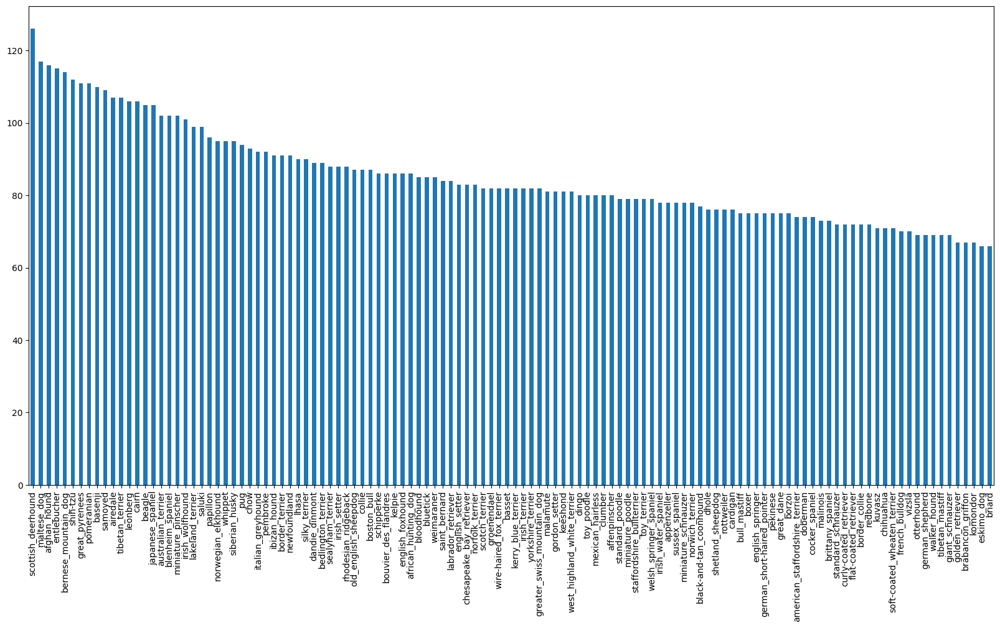

In [ ]:
# how many images are there of each breed 
label_csv["breed"].value_counts().plot.bar(figsize = (20, 10))

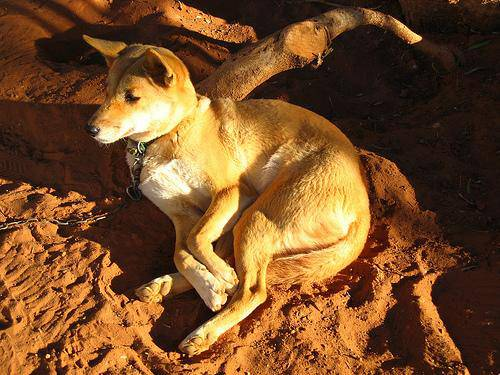

In [ ]:
# lets view an image 
from IPython.display import Image
Image("drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all our image file pathnames

In [ ]:
# getting pathnames from image ID's 
filenames = ["drive/MyDrive/dog-vision/train/" + fname +".jpg" for fname in label_csv["id"]]

#check the first 10
filenames[:10]

['drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/dog-vision/train/")) == len(filenames):
  print("Filenames match actual amount of files so proceed!!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames do not match actual amount of files, check the target directory.


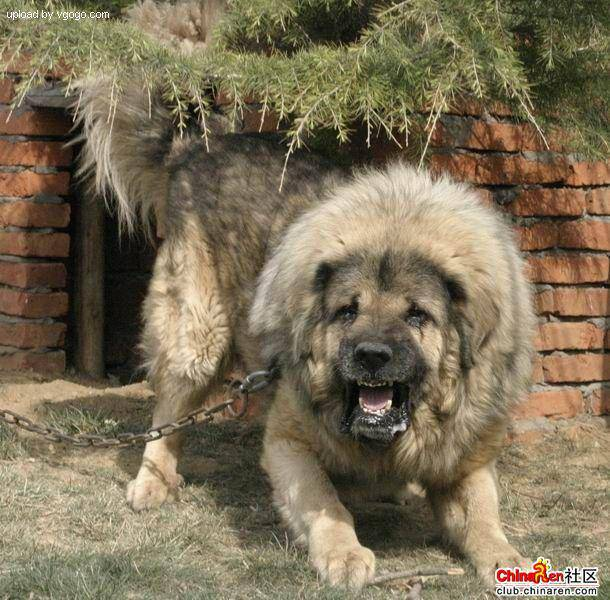

In [ ]:
# one more check
Image(filenames[9000])

Since we've got our training image filepaths in a list, lets prepare our labels

In [ ]:
import numpy as np
labels = label_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# see if number of labels matches number of filenames 
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!!")
else:
  print("Number of labels doesnot match number of files")

Number of labels matches number of filenames!!


In [ ]:
# find the unique label values 
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
 labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every label into a boolean array 
boolean_label = [label == unique_breeds for label in labels]
boolean_label[:2]
len(boolean_label)

10222

In [ ]:
# example : turning boolean array into integers 
print(boolean_label[12].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set 
Since the dataset from kaggle doesnot come with a validation set, we're going to create one

In [ ]:
# setup X & y variables 
X = filenames
y = boolean_label



We're going to start off experimenting with ~ 1000 images and increase as needed

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES= 1000 #@param {type: "slider", min: 1000, max: 10000, step: 1000}


In [ ]:
# lets split our data into train and validation sets 
from sklearn.model_selection import train_test_split

#split them into traininig and validation of totla size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# lets have a geez at the training data 
X_train[:5], y_train[:1]

(['drive/MyDrive/dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images (turning images into tensors)

To preprocess our images into tensor we're going to write a function to perform the action
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
4. Resize the `image` to be a shape of (224,224)
5. Return the modified image

In [ ]:
# convert an image into numpy array
from matplotlib.pyplot import imread 
image = imread(filenames[4])
image.shape

(500, 500, 3)

In [ ]:
# define image size 
IMG_SIZE = 224
#create a function for preprocessing images 
def preprocess_img(image_path):
  """
  A function to preprocess image by converting them to tensor
  """
  #read an image file
  image = tf.io.read_file(image_path)
  #turn the jpeg into numerical tensor with 3 colour channel (Red, Green, BLue)
  image = tf.io.decode_jpeg(image, channels = 3)
  #convert the colour channel values from 0-255 to 0-1 values 
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image to our desired value(224,224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches 

Why turn our data into batches ?

If we try to process 10000+ images in one go, they all might not fit into memory.

So we do about 32 (batch size) images at a time (we can manually adjust the batch size)

Inorder to use Tensorflow, we need our data in the form of tensor tuples which look like `(image, label)`

In [ ]:
# create a simple function to return a tuple(image, label)
def get_image_label(image_path, label):
  """
  a function which returns a tuple of image and label
  """
  image = preprocess_img(image_path)
  
  return image, label 

Now we've got a way to turn our data into tuples of Tensors in the form: `(image,label)`, lets make a function to turn all of our data (X,y) into batches

In [ ]:
# define the batch size, 32 for now
BATCH_SIZE = 32

#create a function to turn data into batches 
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image(X) and label(y) pairs. Shuffles the data if it's training data but doesnt shuffle if its validation data.
  Also accepts test data as input(no labels)
  """
  # if the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only file paths no lables
    data_batch = data.map(preprocess_img).batch(BATCH_SIZE)
    return data_batch

  #if the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  #filepaths
                                               tf.constant(y))) #lables

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

    return data_batch
  else:
    print("Creating training dataset...")
    
    #turn filepaths and labes into tensor for training set 
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  #filepaths
                                               tf.constant(y)))  
                                    
    #shuffling pathnames and labels before mapping image processor function is faster than shuffing images 
    data = data.shuffle(buffer_size = len(X)) 

    #create(image, label) tuples (this also turns image path into a preprocessed image)
    data = data.map(get_image_label)

    #turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
#creating training and validation data batches 
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training dataset...
Creating validation data batches...


In [ ]:
#check out different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in batches, however, these can be little hard to understand, let's visualize them



In [ ]:
import matplotlib.pyplot as plt

#create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  #set up figure
  plt.figure(figsize=(10,10))
  #loop through 25 images 
  for i in range(25):
    # create a subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5, i+1)
    #display an image 
    plt.imshow(images[i])
    #add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the grid lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.63058543, 0.19752347, 0.57250553],
          [0.6241369 , 0.20911452, 0.56507564],
          [0.64688784, 0.23789392, 0.58204424],
          ...,
          [0.51502466, 0.50718147, 0.51894623],
          [0.4069843 , 0.38569716, 0.39122862],
          [0.4254169 , 0.40188748, 0.40188748]],
 
         [[0.5591401 , 0.13656479, 0.45455468],
          [0.62089676, 0.2197938 , 0.51947415],
          [0.6544292 , 0.2538865 , 0.5514863 ],
          ...,
          [0.5017562 , 0.49391302, 0.50567776],
          [0.41841727, 0.402731  , 0.40546203],
          [0.45870778, 0.4430215 , 0.43909994]],
 
         [[0.59689134, 0.18253678, 0.48353472],
          [0.6659909 , 0.27533087, 0.5797882 ],
          [0.6630077 , 0.27763474, 0.5859389 ],
          ...,
          [0.45453128, 0.44668815, 0.45845285],
          [0.3676448 , 0.3519585 , 0.35550538],
          [0.4883594 , 0.47267312, 0.47412622]],
 
         ...,
 
         [[0.40459815, 0.44381383, 0.4830295 ],
          [0.44393

In [ ]:
len(train_images), len(train_labels)

(32, 32)

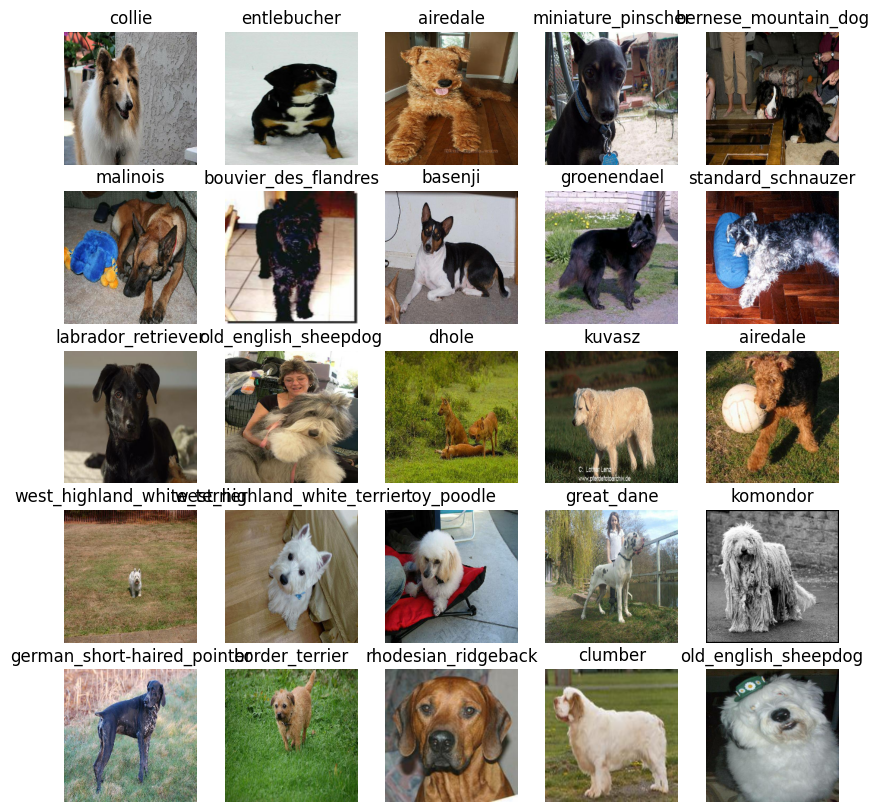

In [ ]:
# lets visualize the data in a training batch
show_25_images(train_images, train_labels)

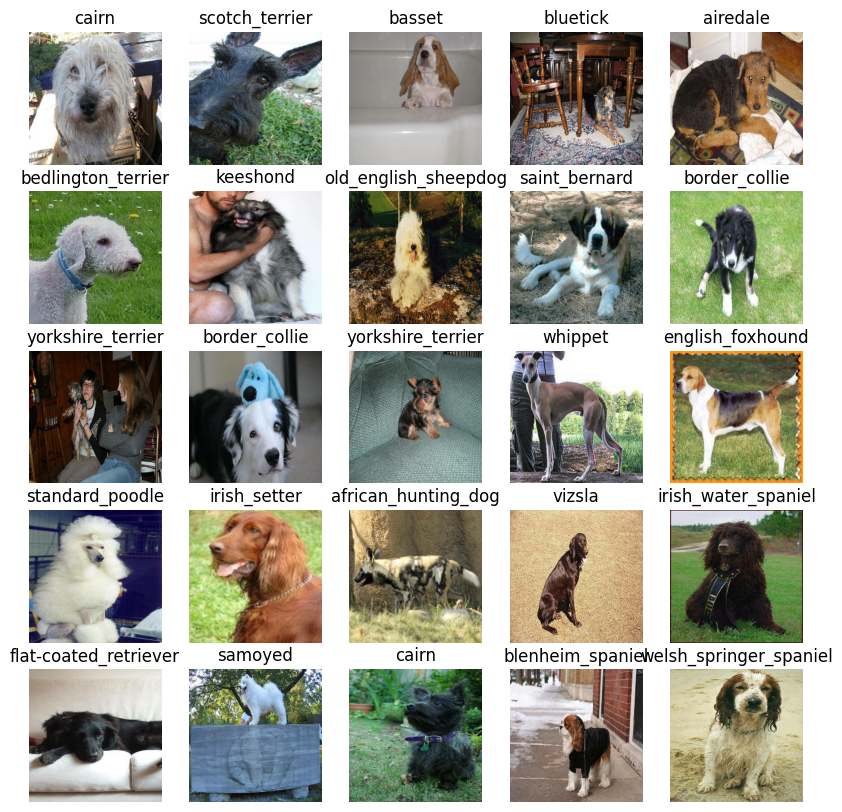

In [ ]:
# now lets visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define: 
* The input shape (our images shape, in the form of tensors) to our model
* The output shape (image labels, in the form of tensors) of our model
* The URL of model we want to use from tensorflow hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

#setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#setup model URL from tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our input, outputs and model ready to go. lets put them together into a keras deep learning model.

Lets create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a keras model in sequential fashion(one after another - linear)
* Compiles the model (says how it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Return the model


In [ ]:
# create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  #setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1(input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") #Layer 2 (output layer)
  ])
  # compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )
  #build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks 

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard callback

To setup a TensorBoard callback, we need to do 3 things 
* Load tensorboard notebook extension
* Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
* Visualize our models training logs with `%tensorboard` magic function(we'll do this after model training)

In [ ]:
# load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#create a function to build a TensorBoard callback 
def create_tensorboard_callback():
  #create a log directory for storing TensorBoard logs 
  logdir = os.path.join("drive/MyDrive/dog-vision/logs",
                        # make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)





```
# This is formatted as code
```

### Early stopping Callback
EarlyStopping is a callback that allows you to stop the training process of a machine learning model early if certain conditions are met. It helps prevent overfitting and saves computational resources by stopping training when the model's performance on a validation set stops improving.

In [ ]:
# create Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience = 3)

### training a model

Our base model will be trained on 1000 images only, to make sure everything is working


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a function which trains a model

* Create a model using `model()`
* setup TensorBoard callback using `create_tensorboard_callback`
* Call the `fit()` function on our model passing it the training data, validation data , number of epochs to train for (NUM_EPOCHS) and callbacks we'd like to use 
* Return the model

In [ ]:
# build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns a trained model 
  """
  
  # create a model
  model = create_model()

  #create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  #return the fitted model
  return model 
  

In [ ]:
# fit the model to the data 
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 113s 3s/step - loss: 4.7150 - accuracy: 0.0800 - val_loss: 3.5716 - val_accuracy: 0.1800
Epoch 2/100
25/25 [==============================] - 3s 118ms/step - loss: 1.6805 - accuracy: 0.6812 - val_loss: 2.1999 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 3s 113ms/step - loss: 0.5739 - accuracy: 0.9425 - val_loss: 1.7118 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 3s 113ms/step - loss: 0.2554 - accuracy: 0.9887 - val_loss: 1.5346 - val_accuracy: 0.5950
Epoch 5/100
25/25 [==============================] - 3s 121ms/step - loss: 0.1471 - accuracy: 0.9975 - val_loss: 1.4461 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 3s 114ms/step - loss: 0.1005 - accuracy: 1.0000 - val_loss: 1.3946 - val_accuracy: 0.6200
Epoch 7/100
25/25 [==============================]

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory and visualize its content

In [ ]:
%tensorboard --logdir drive/MyDrive/dog-vision/logs

<IPython.core.display.Javascript object>

## making and evaluating predictions using a trained model

In [ ]:
# make predictions on validation data 
predictions = model.predict(val_data, verbose = 1)
predictions 

NameError: ignored

In [ ]:
predictions[0].shape

(120,)

In [ ]:
# First prediction
print(predictions[5])
print(f"Max value (probability of prediction): {np.max(predictions[5])}")
print(f"Sum: {np.sum(predictions[5])}")
print(f"Max index: {np.argmax(predictions[5])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[5])]}")

[8.26621090e-06 9.23810730e-05 8.44338720e-05 7.57509517e-03
 1.85850204e-05 3.13228702e-05 1.29229284e-05 6.44207103e-05
 2.45726897e-05 1.07800197e-05 9.73543227e-01 1.39722442e-05
 3.30509720e-05 9.27072233e-06 2.10374455e-05 1.40136865e-04
 1.92387706e-05 6.40017242e-05 1.05772233e-05 2.34994932e-05
 1.89398588e-06 2.85413225e-05 2.34472882e-05 3.38700047e-05
 1.48615873e-04 4.46051081e-06 1.76616186e-06 5.21823858e-06
 5.72283985e-04 1.97159770e-05 3.51912490e-06 2.03190575e-04
 3.28622955e-05 4.98985755e-05 6.39448990e-04 6.72740643e-05
 6.10850566e-06 1.06578027e-05 7.33473498e-05 1.96835987e-04
 9.14712109e-06 7.09464148e-05 5.52781094e-05 1.61360476e-05
 2.61897026e-06 3.12905067e-05 8.37151765e-06 9.00544183e-05
 1.09417633e-05 9.96135441e-06 1.42773106e-05 2.99403450e-06
 2.11301412e-05 1.21795583e-05 1.30494609e-05 2.38031003e-04
 4.18643394e-05 1.23149905e-04 1.68762854e-04 1.57028335e-04
 4.50015577e-05 3.75978088e-05 1.60153777e-05 2.20447509e-06
 3.49993556e-04 1.220228

In [ ]:
unique_breeds[109]

'tibetan_terrier'

Having the above functionality but we want to be able to do it at scale. 

And it would be even better if we could see the image the predition is being made on!

**Note:** Prediction probability are also known as confidence levels 

In [ ]:
#turn prediction probability into their respective level
def get_pred_label(prediction_probability):
  """
  Turns and array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probability)]

# get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

NameError: ignored

Now since our validation data is still in a batch dataset, we'll have to unbatch it to make prediction on the validation images and compare those predictions to validation labels

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a function to unbatch a batch dataset
def unbatch(batch_dataset):
  """
  a function to unbatch a batch dataset ie returns separate arrays of images and labels.
  """
  images = []
  labels = []

  #loop through unbatched data
  for image, label in batch_dataset.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# unbatch the validation data
val_images, val_labels = unbatch(val_data)
val_images[0], val_labels[0]

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get :
* Predictions labels 
* validation labels (truth labels)
* validation images

Let's make some function to make these all a bit more visualize.

We'll create function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probability, labels, images, n =5):
  """
  view the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probability[n], labels[n], images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  
  #change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  # change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)  
  

In [ ]:
plot_pred(prediction_probability=predictions,
          labels = val_labels,
          images = val_images,
          n = 77)

Now we've got one function to visualize our models top prediction, lets make another to view our models top 10 predictions.

This function will: 
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using  `get_pred_label()`
* Find the top 10:
  * Prediction probability indexes
  * Prediction probability values
  * Prediction labels 
* Plot the top 10 prediction probability values and labels, coloring the true label green


In [ ]:
def plot_pred_conf(prediction_probability, labels, n =1 ):
  """
  plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probability[n], labels[n]

  # get predicted label 
  pred_label = get_pred_label(pred_prob)

  # find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  
  #find the top 10 prediction labels 
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # setup plot 
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  
  # change color of true label 
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



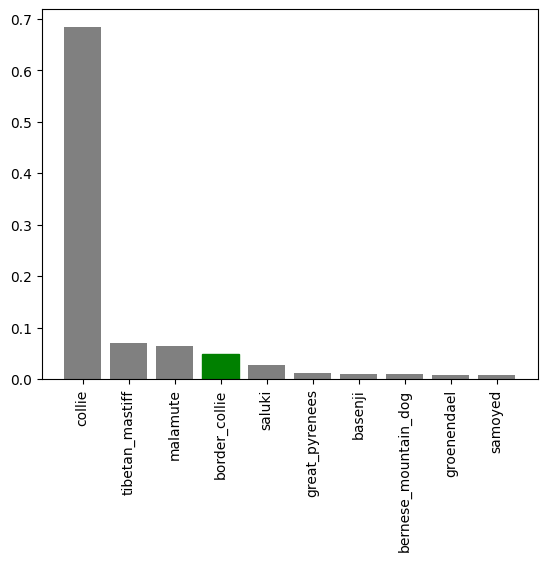

In [ ]:
plot_pred_conf(prediction_probability= predictions,
               labels = val_labels,
               n = 9)

Now we've got some functions to help us visualize our predictions and evaluate our model

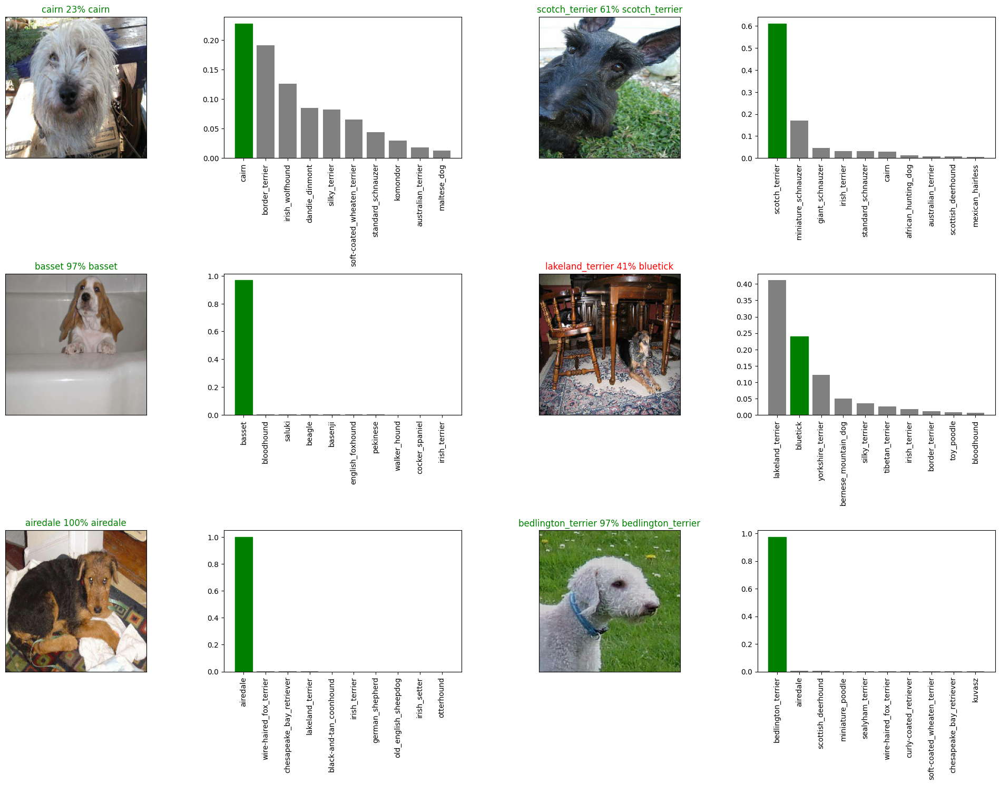

In [ ]:
# lets check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probability = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probability = predictions,
            labels = val_labels,
            n = i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

# Saving and loading our trained model

In [ ]:
# create a function to save a model 
def save_model(model, suffix = None):
  """
  saves a given model in a models directory and appends a suffix (string)
  """
  #create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path
  

In [ ]:
# create a function to load a trained model 
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer" : hub.KerasLayer})
  return model
  

In [ ]:
# save our model trained on 1000 images 
save_model(model, suffix = "1000-images-mobilenetv2-Adam")


In [ ]:
# load a trained model 
loaded_1000_image_model = load_model('drive/MyDrive/dog-vision/models/20230524-05361684906609-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/dog-vision/models/20230524-05361684906609-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model 
model.evaluate(val_data)

7/7 [==============================] - 9s 781ms/step - loss: 5.7024 - accuracy: 0.0100


[5.702439785003662, 0.009999999776482582]

In [ ]:
# evalaute the loadded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 131ms/step - loss: 1.2539 - accuracy: 0.6600


[1.2539167404174805, 0.6600000262260437]

#training a dog vision model on the full data

In [ ]:
# create a data batch with the full data set
full_data = create_data_batches(X,y)

Creating training dataset...


In [ ]:
# create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# create full model callbacks 
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor ="accuracy",
                                                             patience = 3)

In [ ]:
# fit the full model to the full data
full_model.fit(x=full_data, 
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, 
                            full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 44s 118ms/step - loss: 1.3341 - accuracy: 0.6726
Epoch 2/100
320/320 [==============================] - 32s 100ms/step - loss: 0.3960 - accuracy: 0.8817
Epoch 3/100
320/320 [==============================] - 36s 111ms/step - loss: 0.2321 - accuracy: 0.9374
Epoch 4/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1530 - accuracy: 0.9643
Epoch 5/100
320/320 [==============================] - 43s 133ms/step - loss: 0.1031 - accuracy: 0.9805
Epoch 6/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0787 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0568 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0455 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0367 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 34s 105m

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/dog-vision/models/20230524-08141684916096-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/dog-vision/models/20230524-08141684916096-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model('drive/MyDrive/dog-vision/models/20230524-08141684916096-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/dog-vision/models/20230524-08141684916096-full-image-set-mobilenetv2-Adam.h5


## making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get into the same format.

To make predictions on the test data: 
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` [since the test data doesn't have labels]
* Make a prediction array by passing the test batched to the `predict` method called on our model 

In [ ]:
# load test image filename
test_path = "drive/MyDrive/dog-vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/dog-vision/test/e8c778896a73d0f6b4f88c564690c9db.jpg',
 'drive/MyDrive/dog-vision/test/edcd762a5eec11ae0a1e471d576e8be5.jpg',
 'drive/MyDrive/dog-vision/test/e97a63b529b7b274eeb605391366b576.jpg',
 'drive/MyDrive/dog-vision/test/efaa7438a6c3bdf92f90539a1fff55fe.jpg',
 'drive/MyDrive/dog-vision/test/ecab96d4268569065f73b4bb5ddffa59.jpg',
 'drive/MyDrive/dog-vision/test/ed7c3126f50898ce02c08a380c1d0bbc.jpg',
 'drive/MyDrive/dog-vision/test/ed63374c99282b3081705ed84a2b93bc.jpg',
 'drive/MyDrive/dog-vision/test/f00367f07cfcbb8152c9ed908d7c273f.jpg',
 'drive/MyDrive/dog-vision/test/e9d1478e035f22b0cf94be580d620f80.jpg',
 'drive/MyDrive/dog-vision/test/f282ea683674bf3bde3715cb018b1c26.jpg']

In [ ]:
len(test_filenames)

10301

In [ ]:
# create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

322/322 [==============================] - 991s 3s/step


In [ ]:
# save predictions (Numpy array) to csv file(for access later)
np.savetxt("drive/MyDrive/dog-vision/preds_array.csv", test_predictions, delimiter = ",")

## Preparing test dataset predictions for kaggle
To get the data in the required format we'll:
* Create a pandas Dataframe with an ID column as well as a column for each dog breead 
*  Add data to the ID column by extracting the test image ID's from their filepaths.
*  Add data (prediction probabilit) to each of the dog breed column
* Export the DataFrrame as CVS file format

In [ ]:
# create a pandas dataframe with empty columns 
preds_df = pd.DataFrame(columns = ['id'] + list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# append test image ID's to predictions DaaFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]


In [ ]:
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8c778896a73d0f6b4f88c564690c9db,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,edcd762a5eec11ae0a1e471d576e8be5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e97a63b529b7b274eeb605391366b576,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,efaa7438a6c3bdf92f90539a1fff55fe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ecab96d4268569065f73b4bb5ddffa59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
 # add the predictions probabilities o each dog breed column 
 preds_df[list(unique_breeds)] = test_predictions
 preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8c778896a73d0f6b4f88c564690c9db,4.719148e-01,4.252625e-07,1.063749e-08,3.504289e-08,5.890677e-10,6.004095e-12,2.805262e-09,6.794313e-11,8.949800e-11,...,1.248412e-06,5.800753e-11,1.318212e-10,4.603425e-06,7.033770e-12,1.009331e-12,1.107418e-11,1.056415e-08,1.666810e-06,1.968087e-03
1,edcd762a5eec11ae0a1e471d576e8be5,2.565714e-10,1.384056e-07,1.689911e-10,8.316890e-11,7.428038e-07,1.986688e-06,1.216485e-07,1.175028e-04,3.763867e-08,...,8.091907e-11,6.572871e-06,2.816499e-10,7.239124e-07,2.127383e-07,1.859548e-05,1.126266e-08,2.897078e-03,5.388625e-04,1.125432e-06
2,e97a63b529b7b274eeb605391366b576,3.869084e-11,2.417219e-08,4.118593e-08,7.039970e-09,1.200661e-12,3.667966e-10,3.171173e-09,6.058029e-10,1.520839e-10,...,1.833744e-11,4.454512e-11,3.370385e-11,7.284774e-11,9.939592e-11,1.526321e-12,7.028670e-10,1.731946e-08,1.369946e-08,8.781695e-09
3,efaa7438a6c3bdf92f90539a1fff55fe,1.623889e-05,2.368198e-07,3.384516e-09,2.562697e-09,1.868838e-08,8.865365e-11,2.589444e-07,3.888228e-09,4.171366e-08,...,2.299818e-09,1.516008e-11,1.309624e-10,1.968995e-10,7.123300e-08,3.407389e-12,6.381534e-12,1.239104e-10,1.073348e-10,6.726996e-10
4,ecab96d4268569065f73b4bb5ddffa59,2.138703e-08,8.969825e-11,7.326286e-13,2.399231e-11,1.792906e-10,2.035388e-12,8.225670e-10,2.894194e-09,2.028557e-10,...,2.548874e-10,9.398199e-11,4.774697e-12,4.666125e-10,3.982961e-12,4.953303e-12,2.317307e-08,3.641761e-13,2.849163e-11,1.857882e-12


In [ ]:
# save our predictions dataframe to csv for submission to kaggle
preds_df.to_csv("drive/MyDrive/dog-vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index = False)

In [ ]:
## Making predictions on custom images 
